In [2]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
import random
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC 
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix

In [3]:
df = pd.read_csv("/home/krishna/Documents/BTP/KDDTrain.csv")
test_df = pd.read_csv("/home/krishna/Documents/BTP/KDDTest.csv")

In [4]:

columns = (['duration'
,'protocol_type'
,'service'
,'flag'
,'src_bytes'
,'dst_bytes'
,'land'
,'wrong_fragment'
,'urgent'
,'hot'
,'num_failed_logins'
,'logged_in'
,'num_compromised'
,'root_shell'
,'su_attempted'
,'num_root'
,'num_file_creations'
,'num_shells'
,'num_access_files'
,'num_outbound_cmds'
,'is_host_login'
,'is_guest_login'
,'count'
,'srv_count'
,'serror_rate'
,'srv_serror_rate'
,'rerror_rate'
,'srv_rerror_rate'
,'same_srv_rate'
,'diff_srv_rate'
,'srv_diff_host_rate'
,'dst_host_count'
,'dst_host_srv_count'
,'dst_host_same_srv_rate'
,'dst_host_diff_srv_rate'
,'dst_host_same_src_port_rate'
,'dst_host_srv_diff_host_rate'
,'dst_host_serror_rate'
,'dst_host_srv_serror_rate'
,'dst_host_rerror_rate'
,'dst_host_srv_rerror_rate'
,'attack'
,'level'])

df.columns = columns
test_df.columns = columns
print(len(df.columns))

43


In [5]:
is_attack = df.attack.map(lambda a: 0 if a == 'normal' else 1)
test_attack = test_df.attack.map(lambda a: 0 if a == 'normal' else 1)

df['attack_flag'] = is_attack
test_df['attack_flag'] = test_attack


In [6]:
dos_attacks = ['apache2','back','land','neptune','mailbomb','pod','processtable','smurf','teardrop','udpstorm','worm']
probe_attacks = ['ipsweep','mscan','nmap','portsweep','saint','satan']
privilege_attacks = ['buffer_overflow','loadmdoule','perl','ps','rootkit','sqlattack','xterm']
access_attacks = ['ftp_write','guess_passwd','http_tunnel','imap','multihop','named','phf','sendmail','snmpgetattack','snmpguess','spy','warezclient','warezmaster','xclock','xsnoop']


attack_labels = ['Normal','DoS','Probe','Privilege','Access']

In [7]:
def map_attack(attack):
    if attack in dos_attacks:
        attack_type = 1
    elif attack in probe_attacks:
        attack_type = 2
    elif attack in privilege_attacks:
        attack_type = 3
    elif attack in access_attacks:
        attack_type = 4
    else:
        attack_type = 0
    return attack_type

In [8]:
attack_map = df.attack.apply(map_attack)
df['attack_map'] = attack_map
test_attack_map = test_df.attack.apply(map_attack)
test_df['attack_map'] = test_attack_map
df.head()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,attack,level,attack_flag,attack_map
0,0,udp,other,SF,146,0,0,0,0,0,...,0.88,0.00,0.00,0.00,0.0,0.00,normal,15,0,0
1,0,tcp,private,S0,0,0,0,0,0,0,...,0.00,0.00,1.00,1.00,0.0,0.00,neptune,19,1,1
2,0,tcp,http,SF,232,8153,0,0,0,0,...,0.03,0.04,0.03,0.01,0.0,0.01,normal,21,0,0
3,0,tcp,http,SF,199,420,0,0,0,0,...,0.00,0.00,0.00,0.00,0.0,0.00,normal,21,0,0
4,0,tcp,private,REJ,0,0,0,0,0,0,...,0.00,0.00,0.00,0.00,1.0,1.00,neptune,21,1,1


In [9]:
attack_vs_protocol = pd.crosstab(df.attack, df.protocol_type)

In [10]:
def bake_pies(data_list,labels):
    list_length = len(data_list)
    
    color_list = sns.color_palette()
    color_cycle = itertools.cycle(color_list)
    cdict = {}
    
    fig, axs = plt.subplots(1, list_length,figsize=(18,10), tight_layout=False)
    plt.subplots_adjust(wspace=1/list_length)
    
    for count, data_set in enumerate(data_list): 
        for num, value in enumerate(np.unique(data_set.index)):
            if value not in cdict:
                cdict[value] = next(color_cycle)
        wedges,texts = axs[count].pie(data_set,
                           colors=[cdict[v] for v in data_set.index])
        axs[count].legend(wedges, data_set.index,
                           title="Flags",
                           loc="center left",
                           bbox_to_anchor=(1, 0, 0.5, 1))
        axs[count].set_title(labels[count])
    return axs   

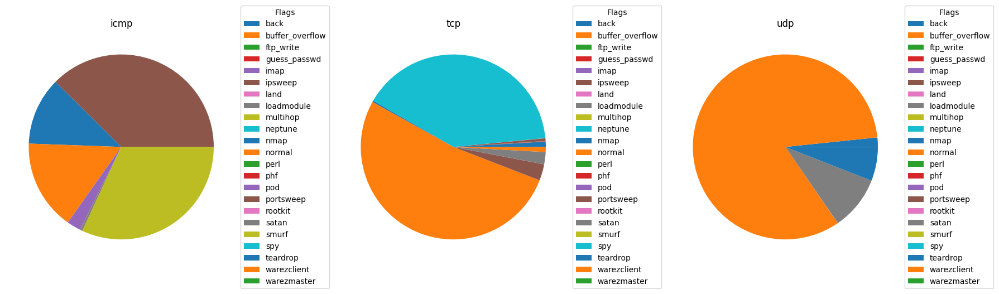

In [11]:
icmp_attacks = attack_vs_protocol.icmp
tcp_attacks = attack_vs_protocol.tcp
udp_attacks = attack_vs_protocol.udp
bake_pies([icmp_attacks, tcp_attacks, udp_attacks],['icmp','tcp','udp'])
plt.show()

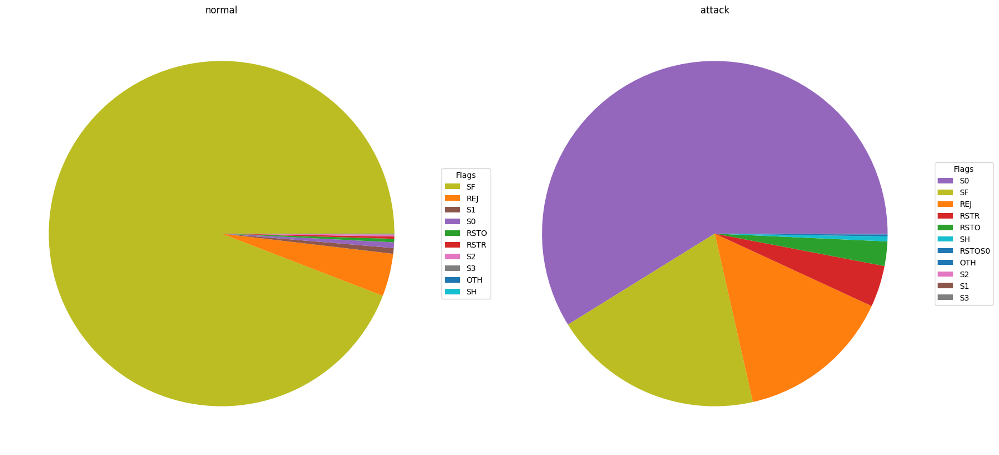

In [12]:

normal_flags = df.loc[df.attack_flag == 0].flag.value_counts()
attack_flags = df.loc[df.attack_flag == 1].flag.value_counts()
flag_axs = bake_pies([normal_flags, attack_flags], ['normal','attack'])        
plt.show()

In [13]:
features_to_encode = ['protocol_type', 'service', 'flag']
encoded = pd.get_dummies(df[features_to_encode])
test_encoded_base = pd.get_dummies(test_df[features_to_encode])
test_index = np.arange(len(test_df.index))
column_diffs = list(set(encoded.columns.values)-set(test_encoded_base.columns.values))
diff_df = pd.DataFrame(0, index=test_index, columns=column_diffs)
column_order = encoded.columns.to_list()
test_encoded_temp = test_encoded_base.join(diff_df)
test_final = test_encoded_temp[column_order].fillna(0)
numeric_features = ['duration', 'src_bytes', 'dst_bytes']
to_fit = encoded.join(df[numeric_features])
test_set = test_final.join(test_df[numeric_features])

In [14]:
binary_y = df['attack_flag']
multi_y = df['attack_map']
test_binary_y = test_df['attack_flag']
test_multi_y = test_df['attack_map']
binary_train_X, binary_val_X, binary_train_y, binary_val_y = train_test_split(to_fit, binary_y, test_size=0.6)
multi_train_X, multi_val_X, multi_train_y, multi_val_y = train_test_split(to_fit, multi_y, test_size = 0.6)

In [15]:
models = [
    LogisticRegression(max_iter=250),
    DecisionTreeClassifier(max_depth=10),
    RandomForestClassifier(),
    KNeighborsClassifier(),
    GaussianNB()
]

# Collecting results
model_comps = []
for model in models:
    model_name = model.__class__.__name__   
    accuracies = cross_val_score(model, binary_train_X, binary_train_y, scoring='accuracy', cv=5)
    recalls = cross_val_score(model, binary_train_X, binary_train_y, scoring='recall', cv=5)
    precisions = cross_val_score(model, binary_train_X, binary_train_y, scoring='precision', cv=5)
    f1_scores = cross_val_score(model, binary_train_X, binary_train_y, scoring='f1', cv=5)

    model_comps.append({
        'Model': model_name,
        'Accuracy': np.mean(accuracies),
        'Recall': np.mean(recalls),
        'Precision': np.mean(precisions),
        'F1 Score': np.mean(f1_scores)
    })

/home/krishna/.local/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/krishna/.local/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regres

In [16]:
# result_df = pd.DataFrame(model_comps, columns=['model_name', 'count', 'accuracy'])
# print("Box Plot of Accuracy Scores")
# result_df.pivot(index='count',columns='model_name',values='accuracy').boxplot(rot=45)
result_df = pd.DataFrame(model_comps)
print(result_df)

                    Model  Accuracy    Recall  Precision  F1 Score
0      LogisticRegression  0.956259  0.956492   0.950389  0.953425
1  DecisionTreeClassifier  0.992478  0.993173   0.990820  0.992058
2  RandomForestClassifier  0.993391  0.994487   0.991168  0.992951
3    KNeighborsClassifier  0.990692  0.992070   0.988092  0.990076
4              GaussianNB  0.531734  0.017089   0.490934  0.033024


In [17]:
plt.figure(figsize=(12, 8))
X_axis = np.arange(len(result_df['Model']))

<Figure size 1200x800 with 0 Axes>

<BarContainer object of 5 artists>

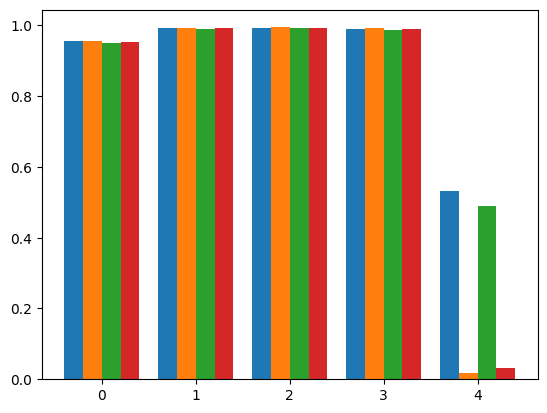

In [18]:
plt.bar(X_axis - 0.3, result_df['Accuracy'], 0.2, label='Accuracy')
plt.bar(X_axis - 0.1, result_df['Recall'], 0.2, label='Recall')
plt.bar(X_axis + 0.1, result_df['Precision'], 0.2, label='Precision')
plt.bar(X_axis + 0.3, result_df['F1 Score'], 0.2, label='F1 Score')

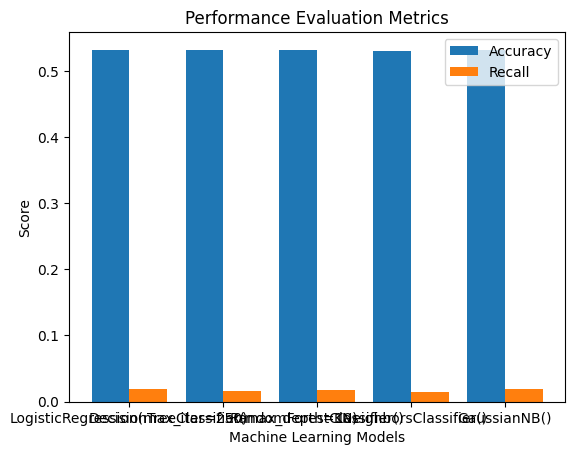

In [19]:
X_axis = np.arange(len(models))
  
plt.bar(X_axis - 0.2, accuracies, 0.4, label = 'Accuracy')
plt.bar(X_axis + 0.2, recalls, 0.4, label = 'Recall')
  
plt.xticks(X_axis, models)
plt.xlabel("Machine Learning Models")
plt.ylabel("Score")
plt.title("Performance Evaluation Metrics")
plt.legend()
plt.show()

In [20]:
#Decision Tree
clf = RandomForestClassifier() #max_depth=10
clf = clf.fit(binary_train_X, binary_train_y)
clf_predictions = clf.predict(binary_val_X) 
train_acc = clf.score(binary_train_X, binary_train_y)
base_clf_score = accuracy_score(clf_predictions,binary_val_y)
print("Training accuracy is:", train_acc*100 )
print("Testing accuracy is:", base_clf_score*100)

Training accuracy is: 99.47408113042788
Testing accuracy is: 99.29350127011007


In [21]:
#Random Forest Performance Metrics
from sklearn.metrics import accuracy_score, f1_score, precision_score,recall_score
Tree_f1 = f1_score(binary_val_y, clf_predictions, average="macro")
Tree_precision = precision_score(binary_val_y, clf_predictions, average="macro")
Tree_recall = recall_score(binary_val_y, clf_predictions, average="macro")
Tree_accuracy = accuracy_score(binary_val_y, clf_predictions)
cm_dtree = confusion_matrix(binary_val_y, clf_predictions)
print('Confusion Matrix: ')
print(cm_dtree)
print("Accuracy Score: ", Tree_f1)
print("Precision Score: ", Tree_precision)
print("Recall Score: ", Tree_recall)
print("F1 Score: ", Tree_accuracy)

Confusion Matrix: 
[[40215   321]
 [  213 34835]]
Accuracy Score:  0.9928990359349712
Precision Score:  0.9928003213493647
Recall Score:  0.9930018667454827
F1 Score:  0.9929350127011007


In [22]:
def add_predictions(data_set,predictions,y):
    prediction_series = pd.Series(predictions, index=y.index)

    predicted_vs_actual = data_set.assign(predicted=prediction_series)
    original_data = predicted_vs_actual.assign(actual=y).dropna()
    conf_matrix = confusion_matrix(original_data['actual'], 
                                   original_data['predicted'])
    
    # capture rows with failed predictions
    base_errors = original_data[original_data['actual'] != original_data['predicted']]
    
    # drop columns with no value
    non_zeros = base_errors.loc[:,(base_errors != 0).any(axis=0)]

    # identify the type of error
    false_positives = non_zeros.loc[non_zeros.actual==0]
    false_negatives = non_zeros.loc[non_zeros.actual==1]

    # put everything into an object
    prediction_data = {'data': original_data,
                       'confusion_matrix': conf_matrix,
                       'errors': base_errors,
                       'non_zeros': non_zeros,
                       'false_positives': false_positives,
                       'false_negatives': false_negatives}
    return prediction_data

<Axes: >

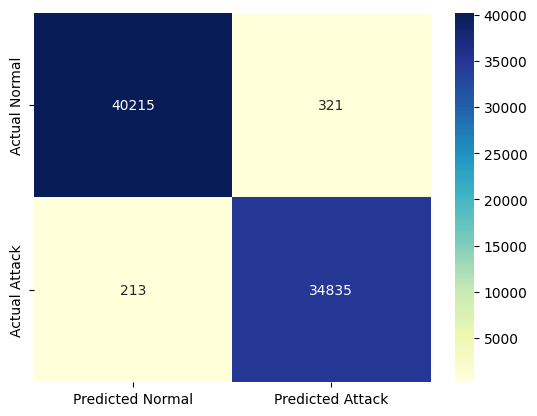

In [23]:
binary_prediction_data = add_predictions(df,
                                         clf_predictions,
                                         binary_val_y)

sns.heatmap(data=binary_prediction_data['confusion_matrix'],
            xticklabels = ['Predicted Normal','Predicted Attack'],
            yticklabels = ['Actual Normal','Actual Attack'],
            cmap="YlGnBu",
            fmt='d',
            annot=True)

In [24]:
binary_prediction_data['errors'].describe()

,duration,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,...,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,level,attack_flag,attack_map,predicted,actual
count,534.000000,5.340000e+02,5.340000e+02,534.000000,534.0,534.0,534.000000,534.000000,534.000000,534.000000,...,534.000000,534.000000,534.000000,534.000000,534.000000,534.000000,534.000000,534.000000,534.000000,534.000000
mean,160.097378,1.327992e+06,3.924150e+03,0.007491,0.0,0.0,0.121723,0.014981,0.095506,0.104869,...,0.049120,0.095225,0.028764,0.344551,0.355993,15.664794,0.398876,0.651685,0.601124,0.398876
std,2020.552964,3.000648e+07,5.756015e+04,0.086305,0.0,0.0,0.919956,0.228709,0.294188,1.106121,...,0.162042,0.223053,0.138059,0.456683,0.466157,5.160646,0.490126,1.000200,0.490126,0.490126
min,0.000000,0.000000e+00,0.000000e+00,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000e+00,0.000000e+00,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,15.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000e+00,0.000000e+00,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.010000,0.000000,18.000000,0.000000,0.000000,1.000000,0.000000
75%,0.000000,0.000000e+00,0.000000e+00,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,...,0.030000,0.050000,0.010000,1.000000,1.000000,19.000000,1.000000,1.000000,1.000000,1.000000
max,42338.000000,6.933756e+08,1.159100e+06,1.000000,0.0,0.0,18.000000,5.000000,1.000000,22.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,21.000000,1.000000,4.000000,1.000000,1.000000


In [25]:
binary_prediction_data['false_negatives']

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,hot,num_failed_logins,logged_in,...,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,attack,level,attack_flag,attack_map,predicted,actual
859,0,tcp,http,REJ,0,0,0,0,0,0,...,0.0,0.0,1.00,1.00,neptune,19,1,1,0.0,1.0
918,0,tcp,http,REJ,0,0,0,0,0,0,...,0.0,0.0,1.00,1.00,neptune,18,1,1,0.0,1.0
1142,0,icmp,tim_i,SF,564,0,0,0,0,0,...,0.0,0.0,0.00,0.00,pod,7,1,1,0.0,1.0
1754,0,tcp,http,REJ,0,0,0,0,0,0,...,0.0,0.0,1.00,1.00,neptune,20,1,1,0.0,1.0
2006,0,tcp,http,REJ,0,0,0,0,0,0,...,0.0,0.0,1.00,1.00,neptune,20,1,1,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
123231,0,tcp,X11,REJ,0,0,0,0,0,0,...,0.0,0.0,0.03,1.00,satan,11,1,2,0.0,1.0
123445,0,tcp,http,REJ,0,0,0,0,0,0,...,0.0,0.0,1.00,1.00,neptune,20,1,1,0.0,1.0
123577,0,tcp,http,S2,54540,8315,0,2,0,1,...,0.0,0.0,0.06,0.06,back,14,1,1,0.0,1.0
124511,0,tcp,http,REJ,0,0,0,0,0,0,...,0.0,0.0,0.93,0.01,ipsweep,6,1,2,0.0,1.0


## Explainable AI with LIME

In [26]:
data = pd.read_csv("/home/krishna/Documents/BTP/KDDTrain.csv")
data.columns = columns
data.drop(['level'], axis=1, inplace=True)
data

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,attack
0,0,udp,other,SF,146,0,0,0,0,0,...,1,0.00,0.60,0.88,0.00,0.00,0.00,0.00,0.00,normal
1,0,tcp,private,S0,0,0,0,0,0,0,...,26,0.10,0.05,0.00,0.00,1.00,1.00,0.00,0.00,neptune
2,0,tcp,http,SF,232,8153,0,0,0,0,...,255,1.00,0.00,0.03,0.04,0.03,0.01,0.00,0.01,normal
3,0,tcp,http,SF,199,420,0,0,0,0,...,255,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,normal
4,0,tcp,private,REJ,0,0,0,0,0,0,...,19,0.07,0.07,0.00,0.00,0.00,0.00,1.00,1.00,neptune
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125967,0,tcp,private,S0,0,0,0,0,0,0,...,25,0.10,0.06,0.00,0.00,1.00,1.00,0.00,0.00,neptune
125968,8,udp,private,SF,105,145,0,0,0,0,...,244,0.96,0.01,0.01,0.00,0.00,0.00,0.00,0.00,normal
125969,0,tcp,smtp,SF,2231,384,0,0,0,0,...,30,0.12,0.06,0.00,0.00,0.72,0.00,0.01,0.00,normal
125970,0,tcp,klogin,S0,0,0,0,0,0,0,...,8,0.03,0.05,0.00,0.00,1.00,1.00,0.00,0.00,neptune


In [27]:
attacks = data['attack'].unique()
attacks

array(['normal', 'neptune', 'warezclient', 'ipsweep', 'portsweep',
       'teardrop', 'nmap', 'satan', 'smurf', 'pod', 'back',
       'guess_passwd', 'ftp_write', 'multihop', 'rootkit',
       'buffer_overflow', 'imap', 'warezmaster', 'phf', 'land',
       'loadmodule', 'spy', 'perl'], dtype=object)

In [28]:
catCols = data.select_dtypes(include = "object").columns
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for feat in catCols:
    data[feat] = le.fit_transform(data[feat].astype(str))
data.head()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,attack
0,0,2,44,9,146,0,0,0,0,0,...,1,0.00,0.60,0.88,0.00,0.00,0.00,0.0,0.00,11
1,0,1,49,5,0,0,0,0,0,0,...,26,0.10,0.05,0.00,0.00,1.00,1.00,0.0,0.00,9
2,0,1,24,9,232,8153,0,0,0,0,...,255,1.00,0.00,0.03,0.04,0.03,0.01,0.0,0.01,11
3,0,1,24,9,199,420,0,0,0,0,...,255,1.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,11
4,0,1,49,1,0,0,0,0,0,0,...,19,0.07,0.07,0.00,0.00,0.00,0.00,1.0,1.00,9


In [29]:
from sklearn.model_selection import train_test_split
x = data.iloc[:,:-1]
y = data.iloc[:,-1]

In [30]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2)
y_test

2076      11
123152    17
47883     11
47011     11
48355     11
          ..
15626      9
56419      9
72114     11
35918      5
39644     11
Name: attack, Length: 25195, dtype: int64

In [31]:
model = DecisionTreeClassifier(random_state=18)
model.fit(x_train, y_train)

DecisionTreeClassifier(random_state=18)

In [32]:
import lime
from lime import lime_tabular

explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train),
    feature_names=x_train.columns,
    class_names=attacks,
    mode='classification'
)

In [33]:
y_test.mode() 

0    11
Name: attack, dtype: int64

### LIME interpretation for different attacks in the test dataset


In [34]:
from lime import lime_tabular
import pandas as pd

# Ensure that the data used for LIME is in the right format
x_train = pd.DataFrame(x_train, columns=x.columns)  # Ensure x_train has correct columns

# Instantiate the explainer
explainer = lime_tabular.LimeTabularExplainer(
    training_data=x_train.values,  # Pass as numpy array
    feature_names=x_train.columns,  # Column names for features
    class_names=[str(i) for i in range(len(attacks))],  # Class names as attack types (replace with your classes)
    mode='classification'  # Specify the type of problem (classification)
)

# Explain instances (for the first few rows of x_test, you can modify this)
for i in range(5):  # Change to the range you want to inspect
    exp = explainer.explain_instance(
        data_row=x_train.iloc[i].values,  # Pass a single instance from the training data
        predict_fn=model.predict_proba  # Use predict_proba for probabilities
    )
    
    exp.show_in_notebook(show_table=True, show_all=False)


/home/krishna/.local/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


/home/krishna/.local/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


/home/krishna/.local/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


/home/krishna/.local/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


/home/krishna/.local/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


In [35]:
exp = explainer.explain_instance(
    data_row=x_train.iloc[1].values,  # Select one row from your training data
    predict_fn=model.predict_proba  # Use model's predict_proba method for probability outputs
)
exp.show_in_notebook(show_table=True, show_all=False)  # Displays explanation for that instance


/home/krishna/.local/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


In [36]:
for i in range(1, 5):
    exp = explainer.explain_instance(data_row=x_train.iloc[i], 
                                     predict_fn=model.predict_proba)

    exp.show_in_notebook(show_table=True)

/home/krishna/.local/lib/python3.10/site-packages/lime/discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/home/krishna/.local/lib/python3.10/site-packages/lime/discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/home/krishna/.local/lib/python3.10/site-packages/lime/lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access 

/home/krishna/.local/lib/python3.10/site-packages/lime/discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/home/krishna/.local/lib/python3.10/site-packages/lime/discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/home/krishna/.local/lib/python3.10/site-packages/lime/lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access 

/home/krishna/.local/lib/python3.10/site-packages/lime/discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/home/krishna/.local/lib/python3.10/site-packages/lime/discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/home/krishna/.local/lib/python3.10/site-packages/lime/lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access 

/home/krishna/.local/lib/python3.10/site-packages/lime/discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/home/krishna/.local/lib/python3.10/site-packages/lime/discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/home/krishna/.local/lib/python3.10/site-packages/lime/lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access 

## Explainable AI with SHAP

In [37]:
import shap
# Fit the SHAP explainer
explainer = shap.Explainer(model.predict, x_test)
# Calculate SHAP values
shap_values = explainer(x_test)

PermutationExplainer explainer: 25196it [06:59, 58.84it/s]                      


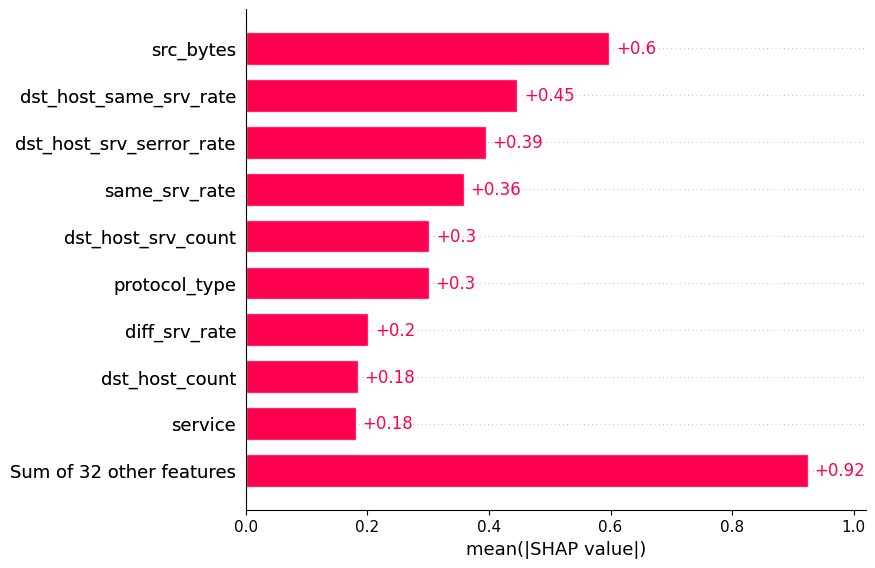

In [51]:
# Bar Plot
shap.plots.bar(shap_values)

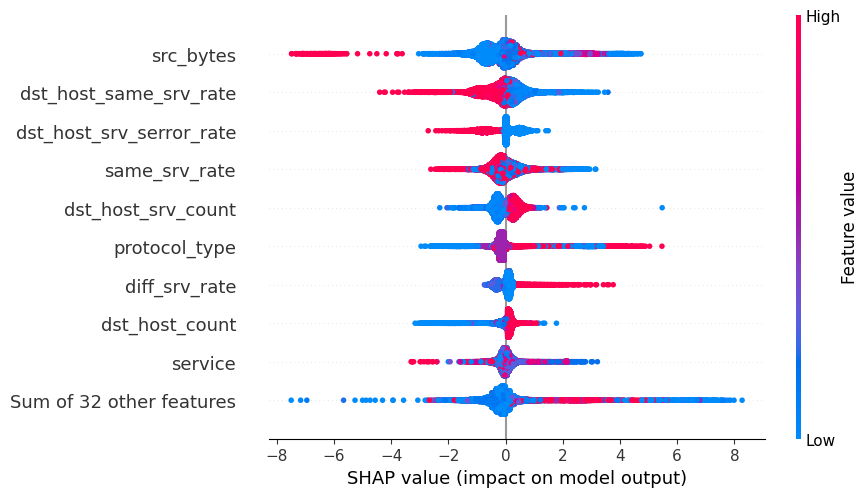

In [52]:
# Summary Plot (Beeswarm)
shap.plots.beeswarm(shap_values)

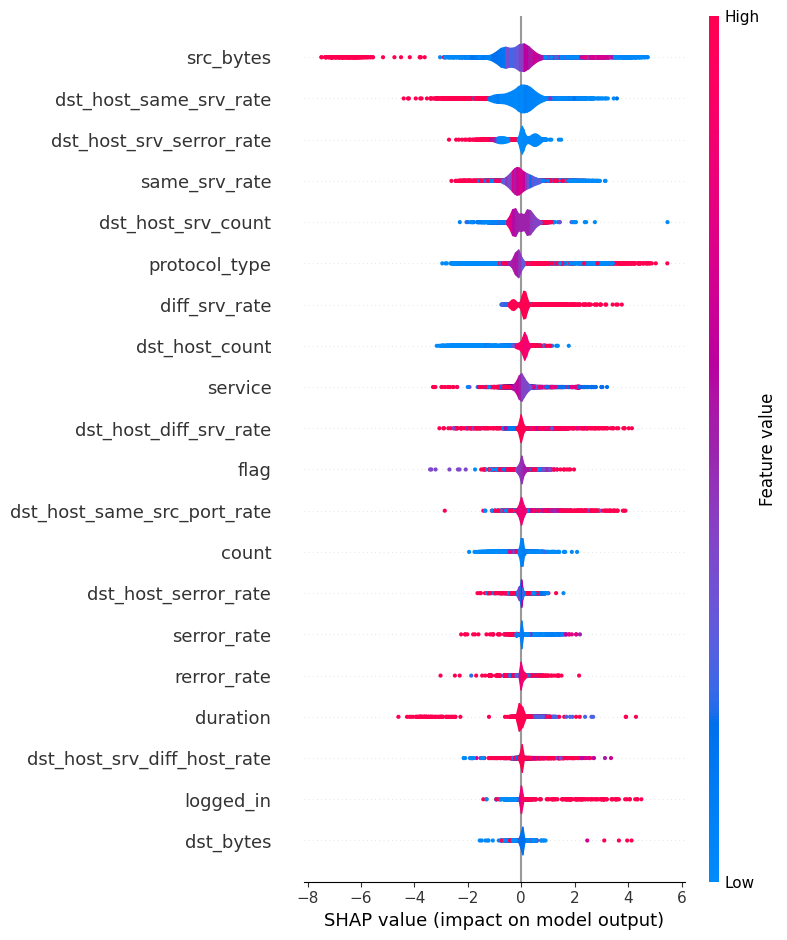

In [53]:
# Summary Plot (Violin)
shap.summary_plot(shap_values, plot_type='violin')

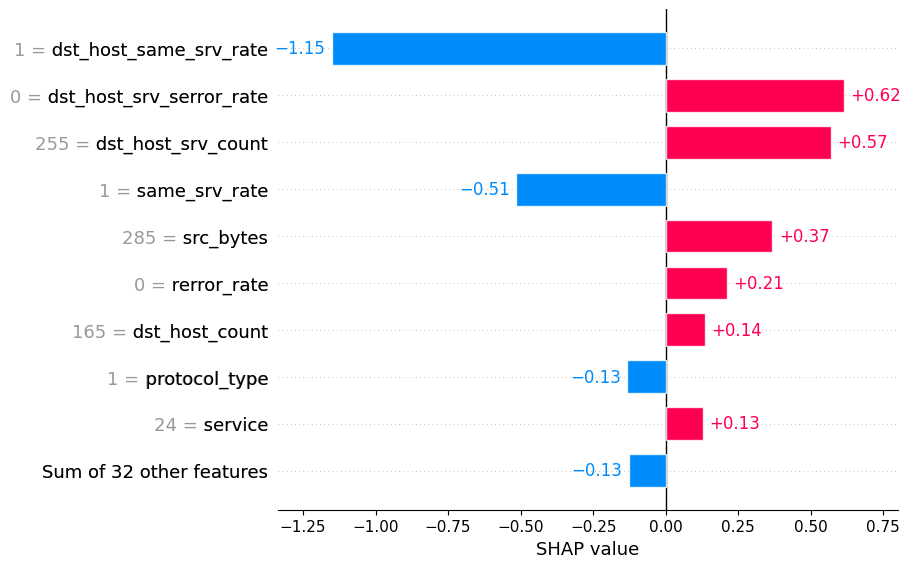

In [54]:
# Local Bar Plot
shap.plots.bar(shap_values[0])

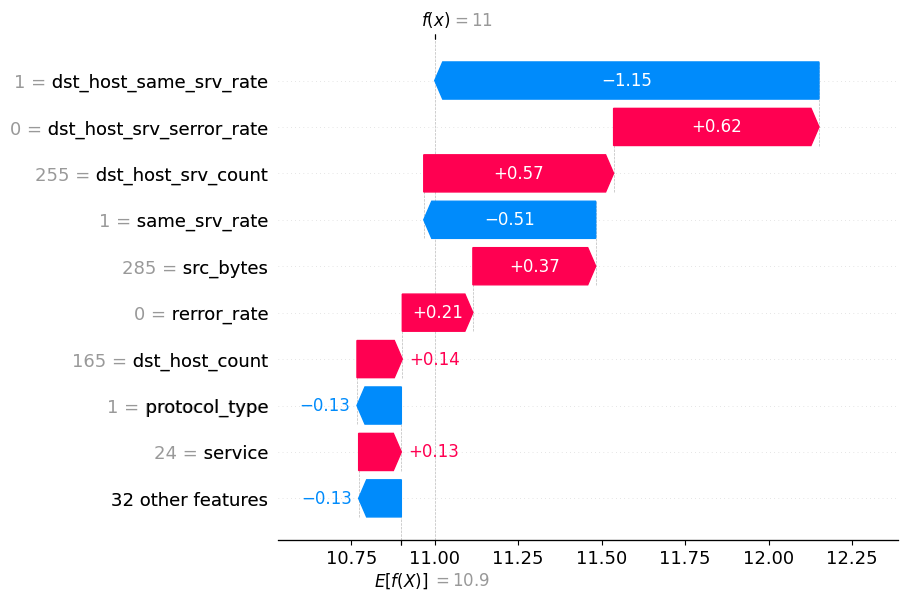

In [55]:
# Waterfall Plot
shap.plots.waterfall(shap_values[0])